[![Roboflow Notebooks](https://ik.imagekit.io/roboflow/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv8 Instance Segmentation on a Custom Dataset

---

[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/how-to-train-yolov8-on-a-custom-dataset)
[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/wuZtUMEiKWY)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/ultralytics/ultralytics)

Ultralytics YOLOv8 is the latest version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.

## ⚠️ Disclaimer

YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **03.01.2024** with version **YOLOv8.0.196**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

## Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on how to train YOLOv8 Instance Segmentation, concurrently.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLOv8
- CLI Basics
- Inference with Pre-trained COCO Model
- Roboflow Universe
- Preparing a custom dataset
- Custom Training
- Validate Custom Model
- Inference with Custom Model
- Deploy the Trained Model to Roboflow

**Let's begin!**

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Sun Mar  3 17:21:00 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **03.01.2024** with version **YOLOv8.0.196**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
# Git clone method (for development)

# %cd {HOME}
# !git clone github.com/ultralytics/ultralytics
# %cd {HOME}/ultralytics
# !pip install -e .

# from IPython import display
# display.clear_output()

# import ultralytics
# ultralytics.checks()

In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

## CLI Basics

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

## Inference with Pre-trained COCO Model

### 💻 CLI

`yolo mode=predict` runs YOLOv8 inference on a variety of sources, downloading models automatically from the latest YOLOv8 release, and saving results to `runs/predict`.

In [5]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=true

/content
100% 22.8M/22.8M [00:00<00:00, 353MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

100% 104k/104k [00:00<00:00, 62.0MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 1 handbag, 178.4ms
Speed: 11.5ms preprocess, 178.4ms inference, 1284.5ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [6]:
model = YOLO(f'{HOME}/yolov8s-seg.pt')

In [7]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="Lk29EIpXiNWcU8wK1SuH")
project = rf.workspace("www-36lz4").project("data-52hrm")
version = project.version(2)
dataset = version.download("yolov8")


/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.5 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to data-2 in yolov8:: 100%|██████████| 4110/4110 [00:01<00:00, 3384.66it/s]


## Custom Training

In [8]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

/content
New https://pypi.org/project/ultralytics/8.1.20 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/datasets/data-2/data.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=Fal

In [9]:
!ls {HOME}/runs/segment/train/

args.yaml					   MaskF1_curve.png	train_batch1.jpg
BoxF1_curve.png					   MaskP_curve.png	train_batch2.jpg
BoxP_curve.png					   MaskPR_curve.png	val_batch0_labels.jpg
BoxPR_curve.png					   MaskR_curve.png	val_batch0_pred.jpg
BoxR_curve.png					   results.csv		val_batch1_labels.jpg
confusion_matrix_normalized.png			   results.png		val_batch1_pred.jpg
confusion_matrix.png				   train_batch0.jpg	val_batch2_labels.jpg
events.out.tfevents.1709486548.e2102d91019d.647.0  train_batch1130.jpg	val_batch2_pred.jpg
labels_correlogram.jpg				   train_batch1131.jpg	weights
labels.jpg					   train_batch1132.jpg


/content


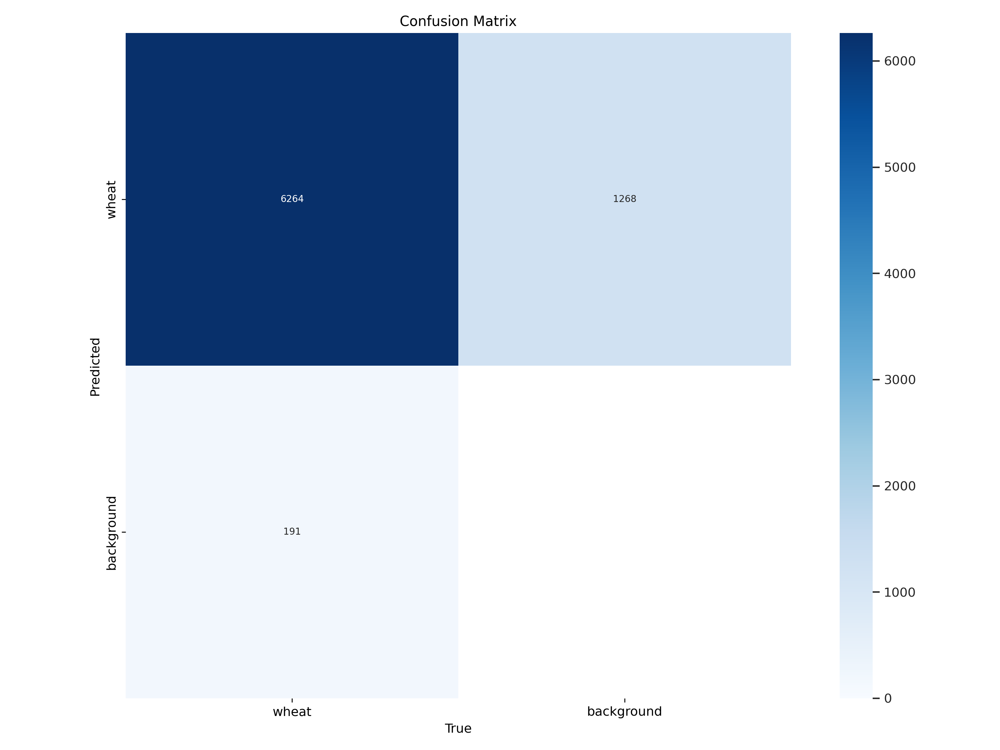

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

/content


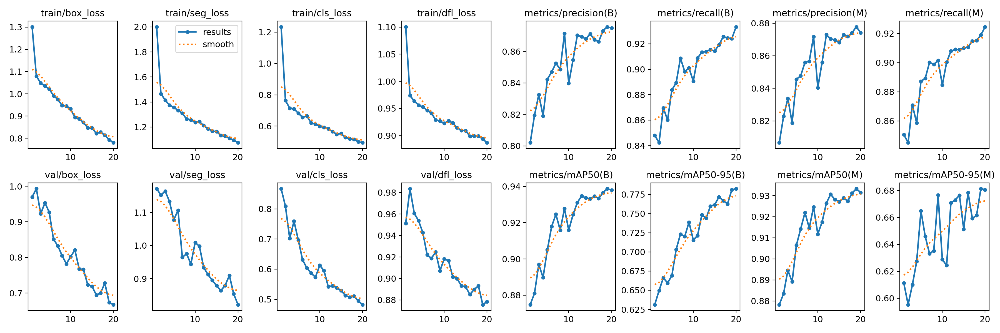

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png', width=600)

/content


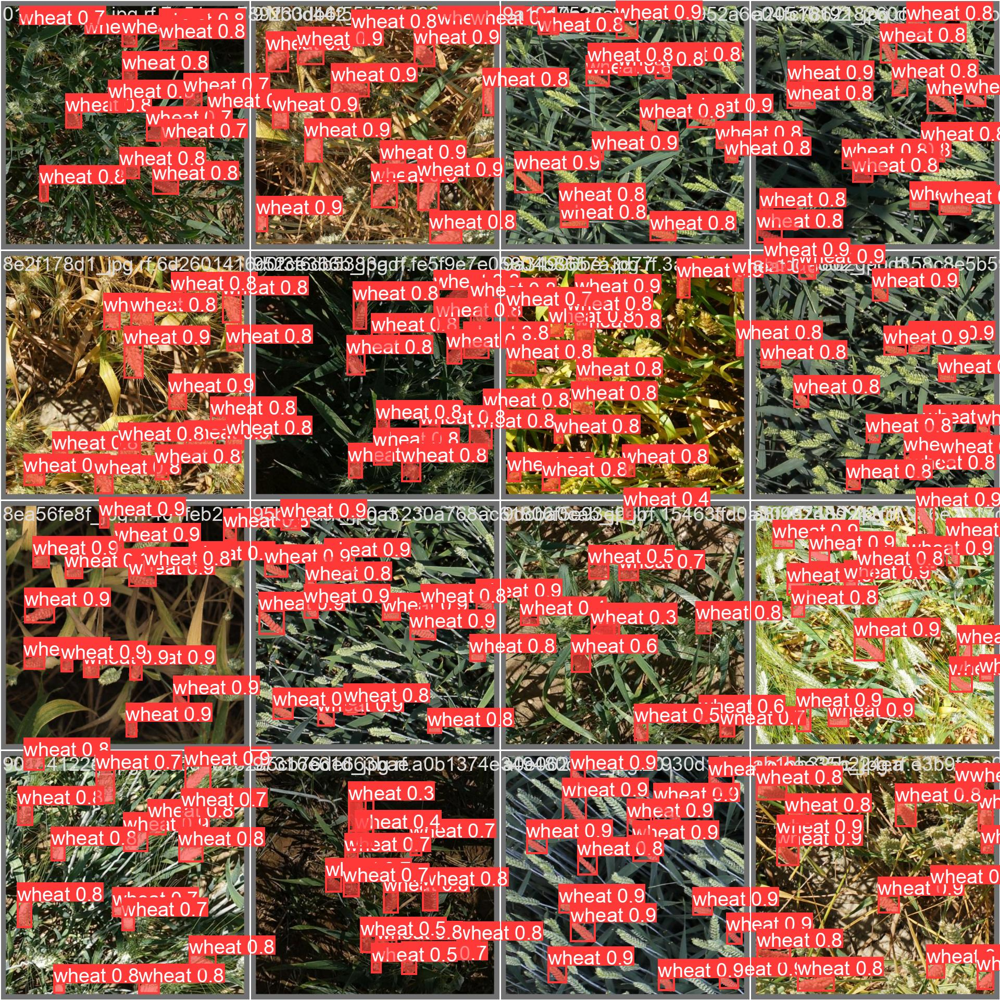

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs
val: Scanning /content/datasets/data-2/valid/labels.cache... 170 images, 6 backgrounds, 0 corrupt: 100% 170/170 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/data-2/valid/images/6e6f7dd89_jpg.rf.1f22ffa937644d7066140573f45a3c75.jpg: 38 duplicate labels removed
val: WARNING ⚠️ /content/datasets/data-2/valid/images/6fb67942f_jpg.rf.5004a3125fc5af38e4d78c2456332bb5.jpg: 10 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 11/11 [00:21<00:00,  1.94s/it]
                   all        170       6455      0.873      0.931      0.939      0.782      0.868      0.926      0.933      0.666
Speed: 2.5ms preprocess, 16.8ms inference, 0.0ms loss, 5.7ms postprocess per image
Results saved to runs/segme

## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=true

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/83 /content/datasets/data-2/test/images/02640d9da_jpg.rf.8b608c1e23c559b2d35e42508f21a87b.jpg: 640x640 65 wheats, 20.9ms
image 2/83 /content/datasets/data-2/test/images/045d846eb_jpg.rf.317ec3ef81be1f0892bf69d54af23c48.jpg: 640x640 56 wheats, 20.9ms
image 3/83 /content/datasets/data-2/test/images/04fe56fd3_jpg.rf.50f14a0c47ee9f673260bdcfa69dbbb5.jpg: 640x640 66 wheats, 20.8ms
image 4/83 /content/datasets/data-2/test/images/05c6591ee_jpg.rf.7334d2fad14deecb930beaec0dd78826.jpg: 640x640 15 wheats, 20.9ms
image 5/83 /content/datasets/data-2/test/images/0874422e6_jpg.rf.9d2209859fbe82857281fa7b9f006575.jpg: 640x640 41 wheats, 20.9ms
image 6/83 /content/datasets/data-2/test/images/0dc9eb168_jpg.rf.5096e0245ba05776c241201f8985b345.jpg: 640x640 63 wheats, 20.9ms
image 7/83 /content/datasets/data-2/test/

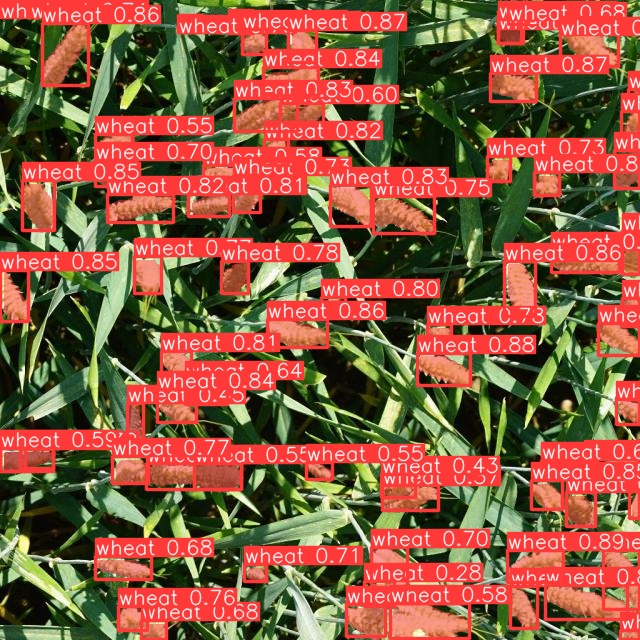

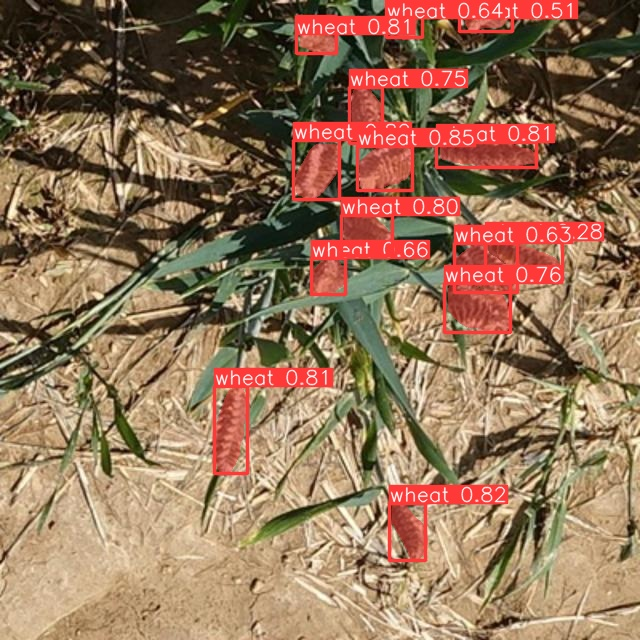

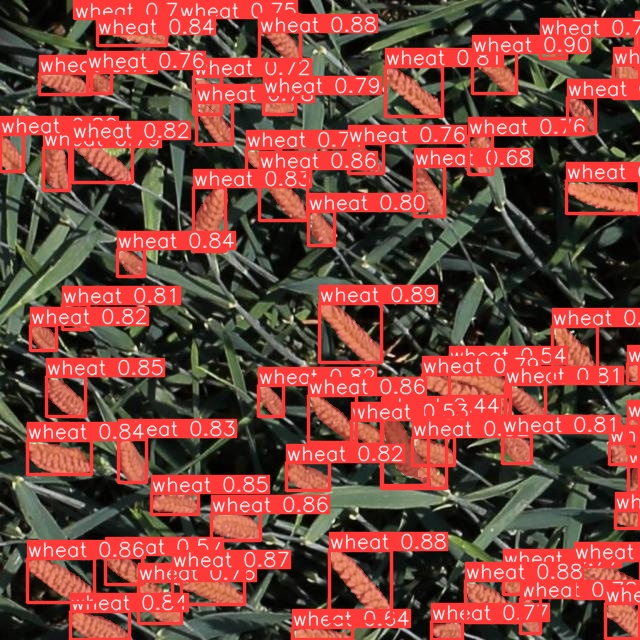

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict2/*.jpg')[:3]:
      display(Image(filename=image_path, height=600))
      print("\n")

In [36]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/testt save=true

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

image 1/10 /content/datasets/data-2/testt/2fd875eaa.jpg: 640x640 31 wheats, 631.4ms
image 2/10 /content/datasets/data-2/testt/348a992bb.jpg: 640x640 38 wheats, 554.6ms
image 3/10 /content/datasets/data-2/testt/51b3e36ab.jpg: 640x640 30 wheats, 558.5ms
image 4/10 /content/datasets/data-2/testt/51f1be19e.jpg: 640x640 19 wheats, 523.2ms
image 5/10 /content/datasets/data-2/testt/53f253011.jpg: 640x640 30 wheats, 507.0ms
image 6/10 /content/datasets/data-2/testt/796707dd7.jpg: 640x640 31 wheats, 676.2ms
image 7/10 /content/datasets/data-2/testt/aac893a91.jpg: 640x640 21 wheats, 790.2ms
image 8/10 /content/datasets/data-2/testt/cb8d261a3.jpg: 640x640 26 wheats, 504.9ms
image 9/10 /content/datasets/data-2/testt/cc3532ff6.jpg: 640x640 28 wheats, 508.1ms
image 10/10 /content/datasets/data-2/testt/f5a1f0358.jpg: 640x

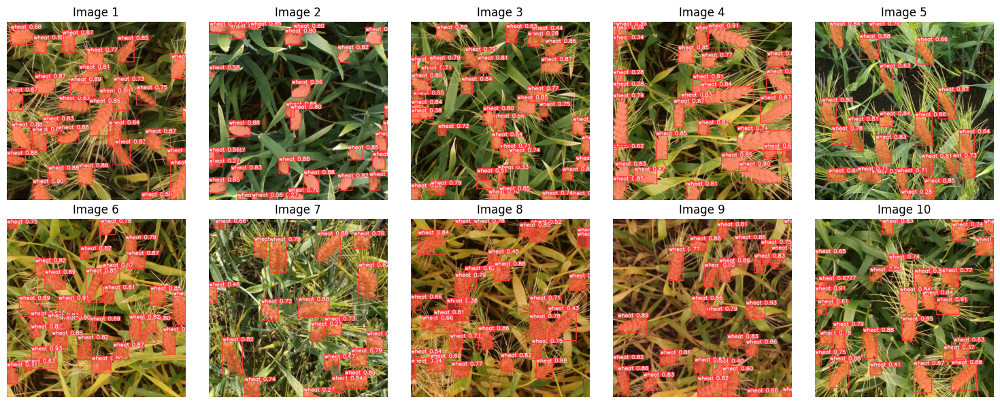

In [40]:
import glob
import matplotlib.pyplot as plt

# Get the list of image paths
image_paths = glob.glob(f'{HOME}/runs/segment/predict17/*.jpg')[:10]

# Create subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Iterate over image paths and display images
for i, image_path in enumerate(image_paths):
    # Read the image file
    with open(image_path, 'rb') as f:
        img = plt.imread(f)

    # Display the image on the corresponding subplot
    axes[i].imshow(img)
    axes[i].axis('off')  # Turn off axis labels
    axes[i].set_title(f'Image {i+1}')  # Set title for the image

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


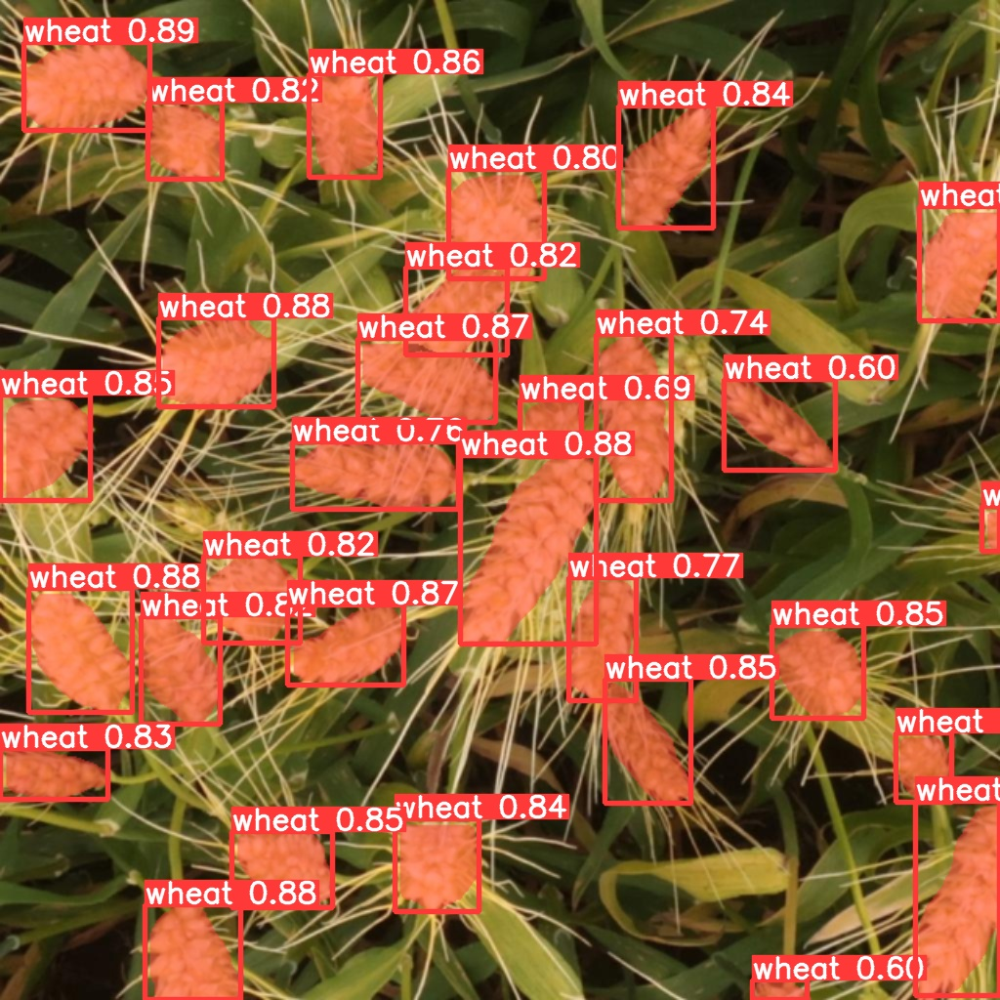

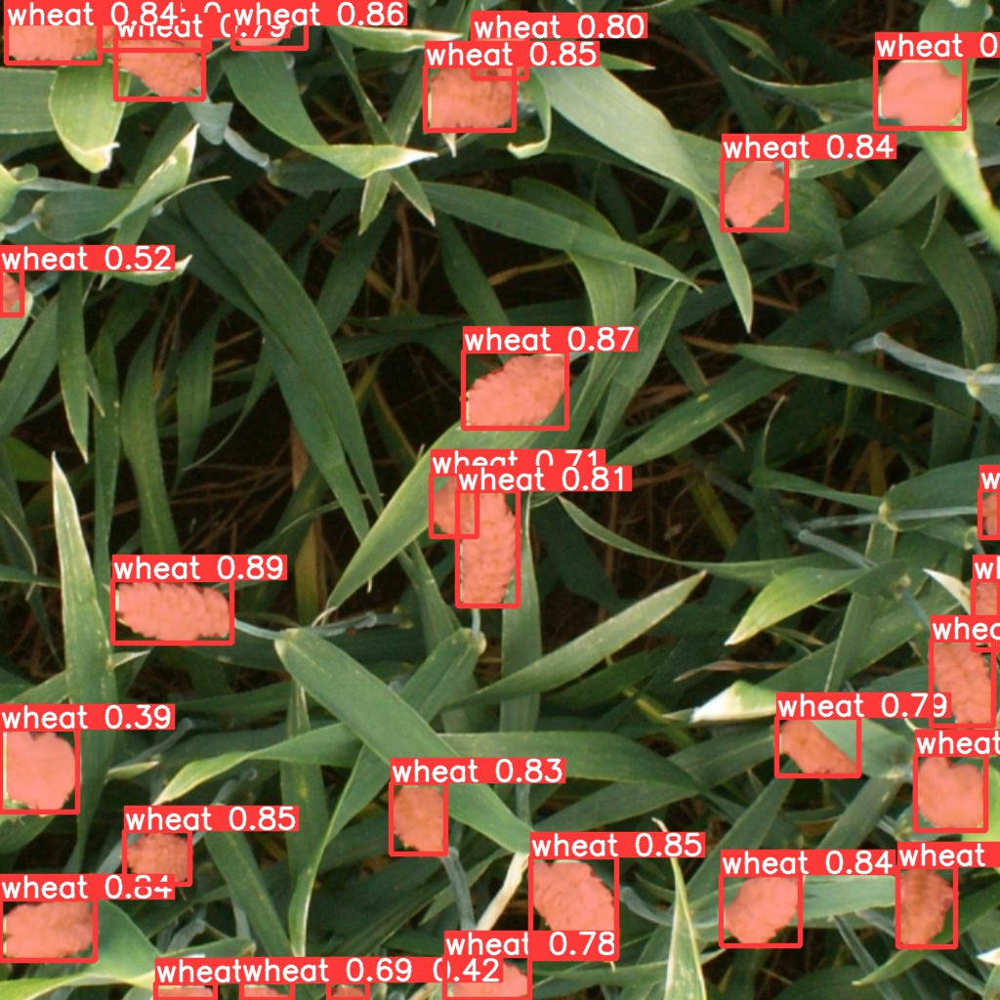

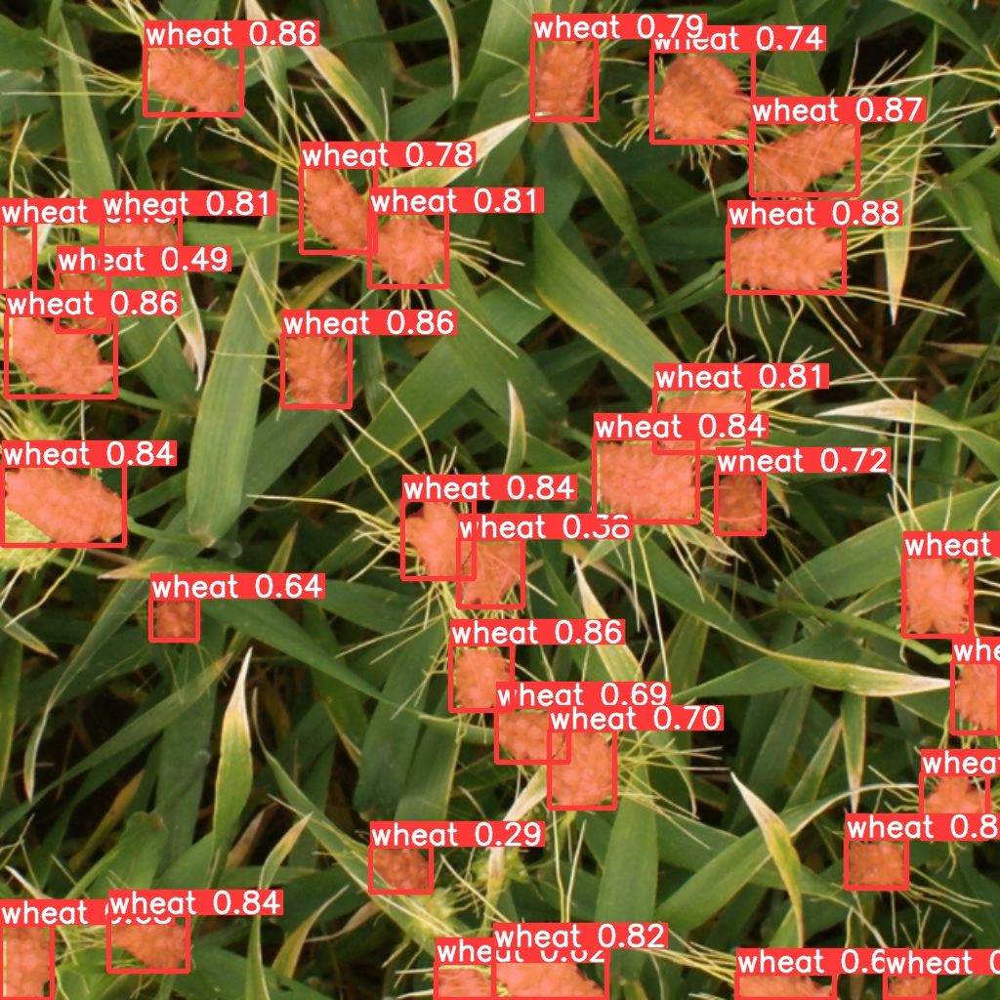

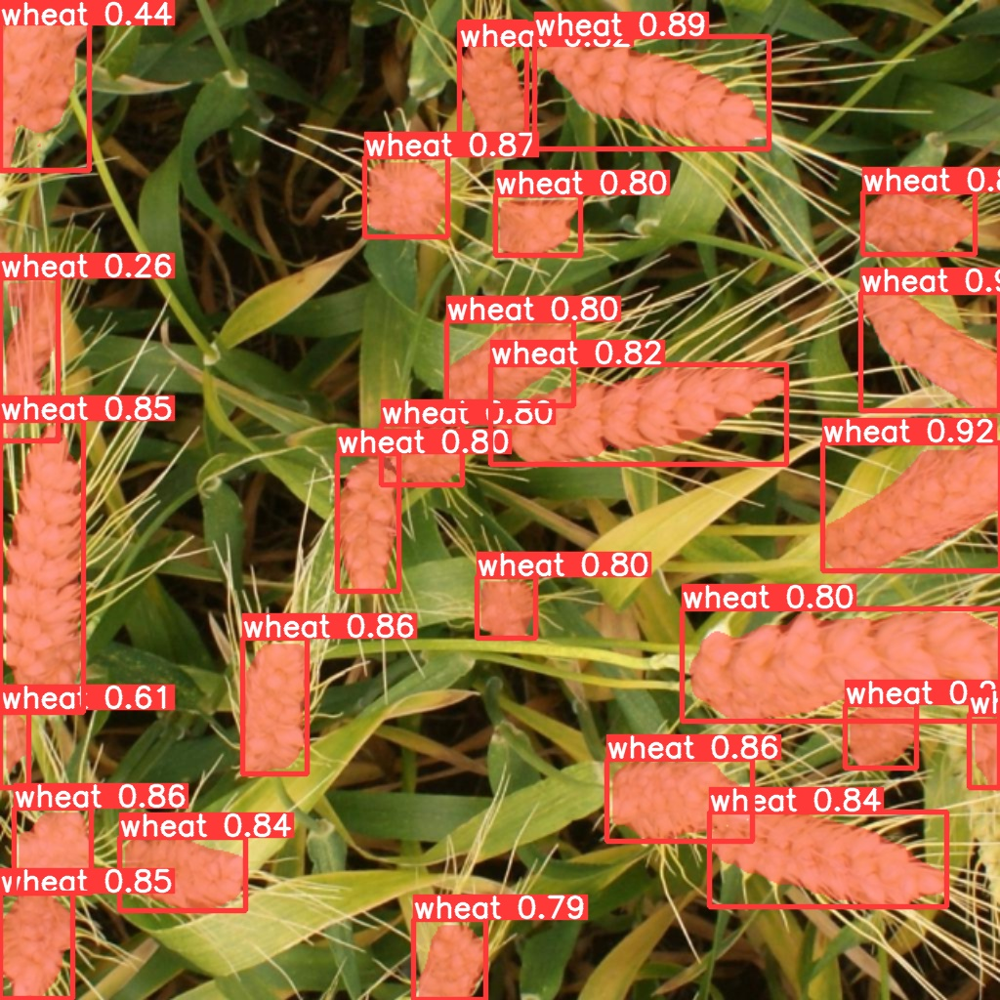

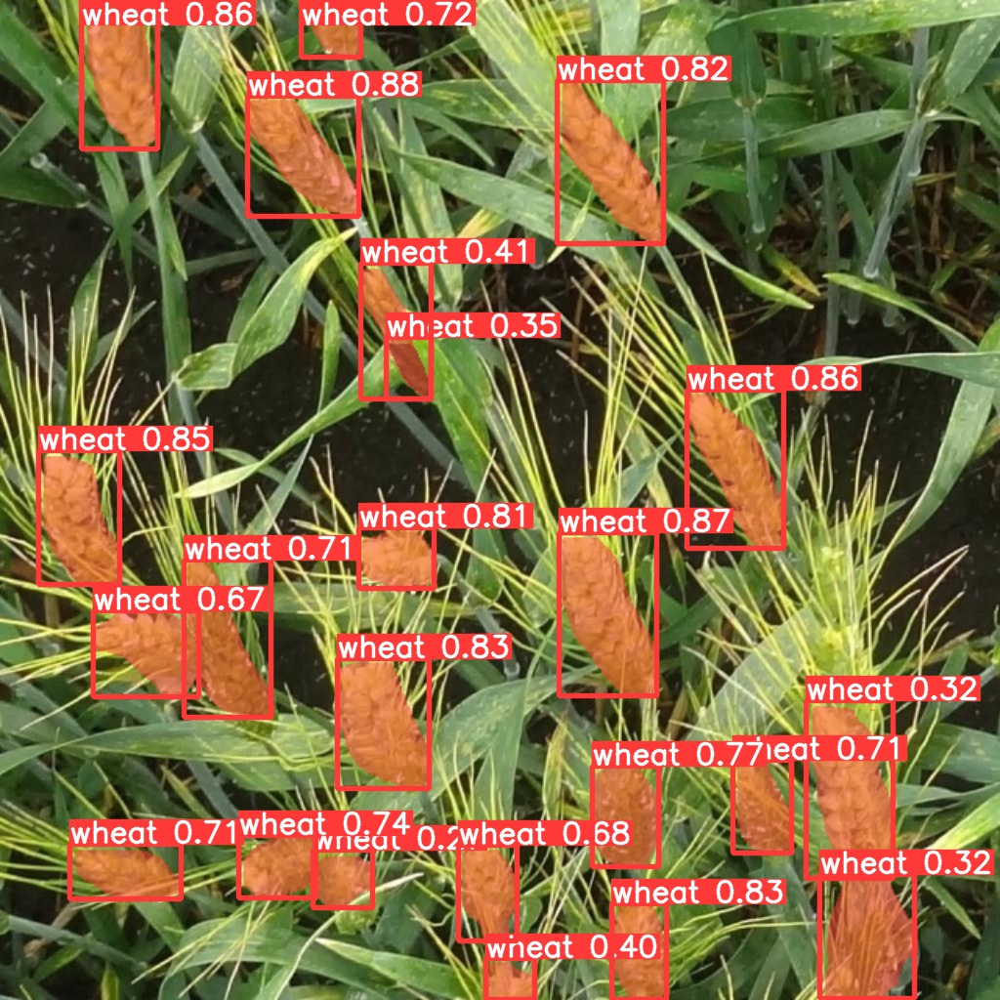

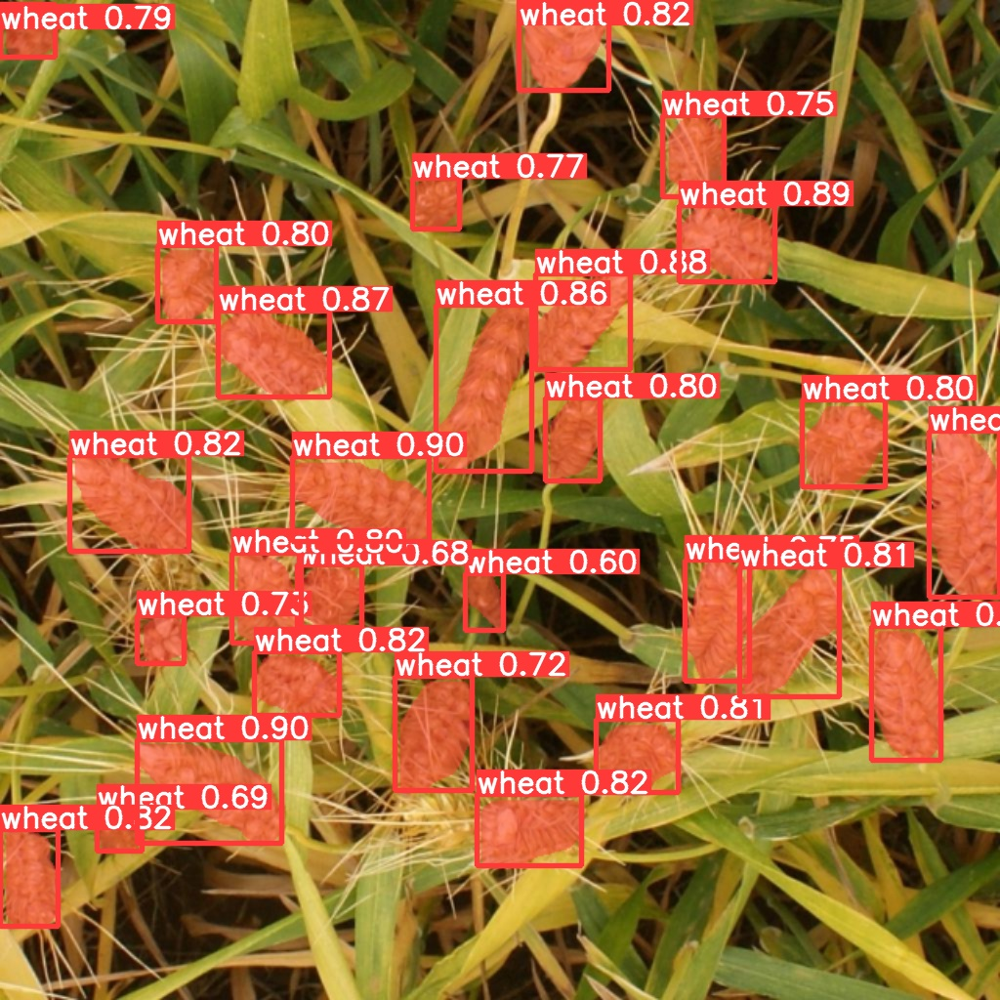

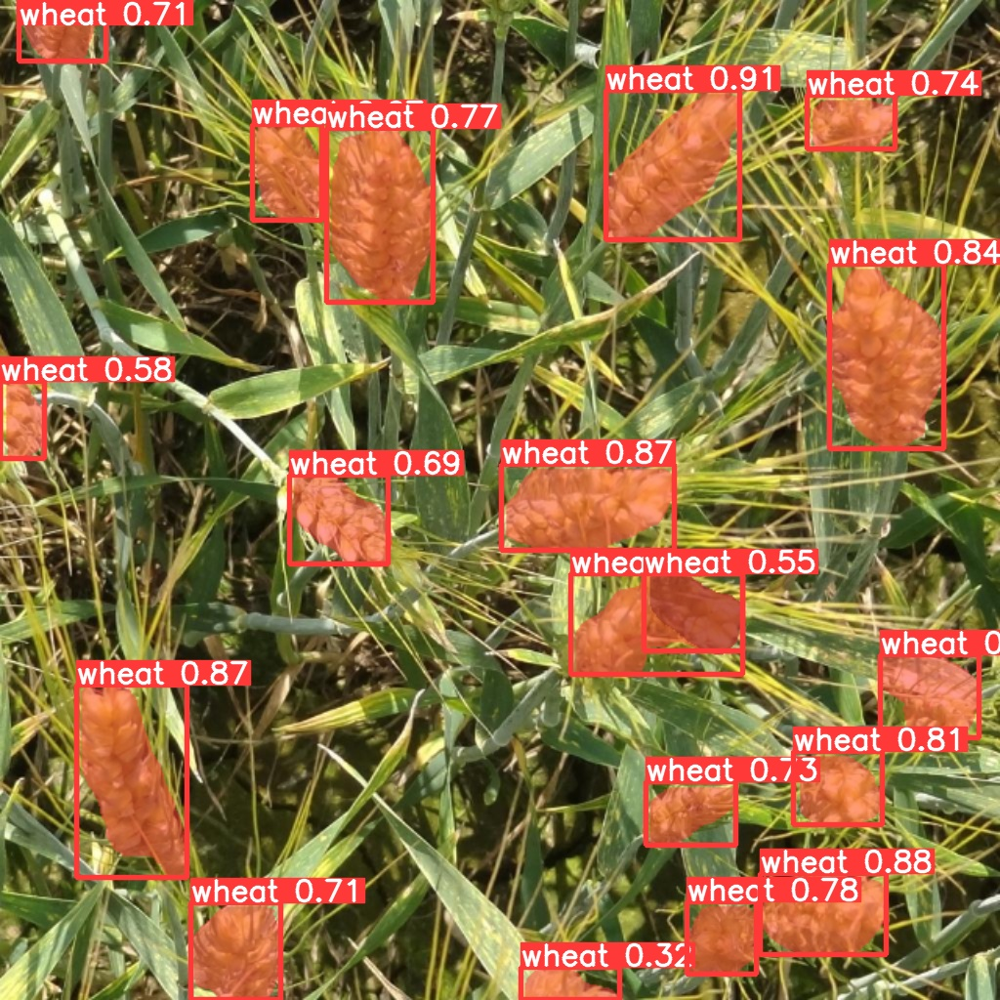

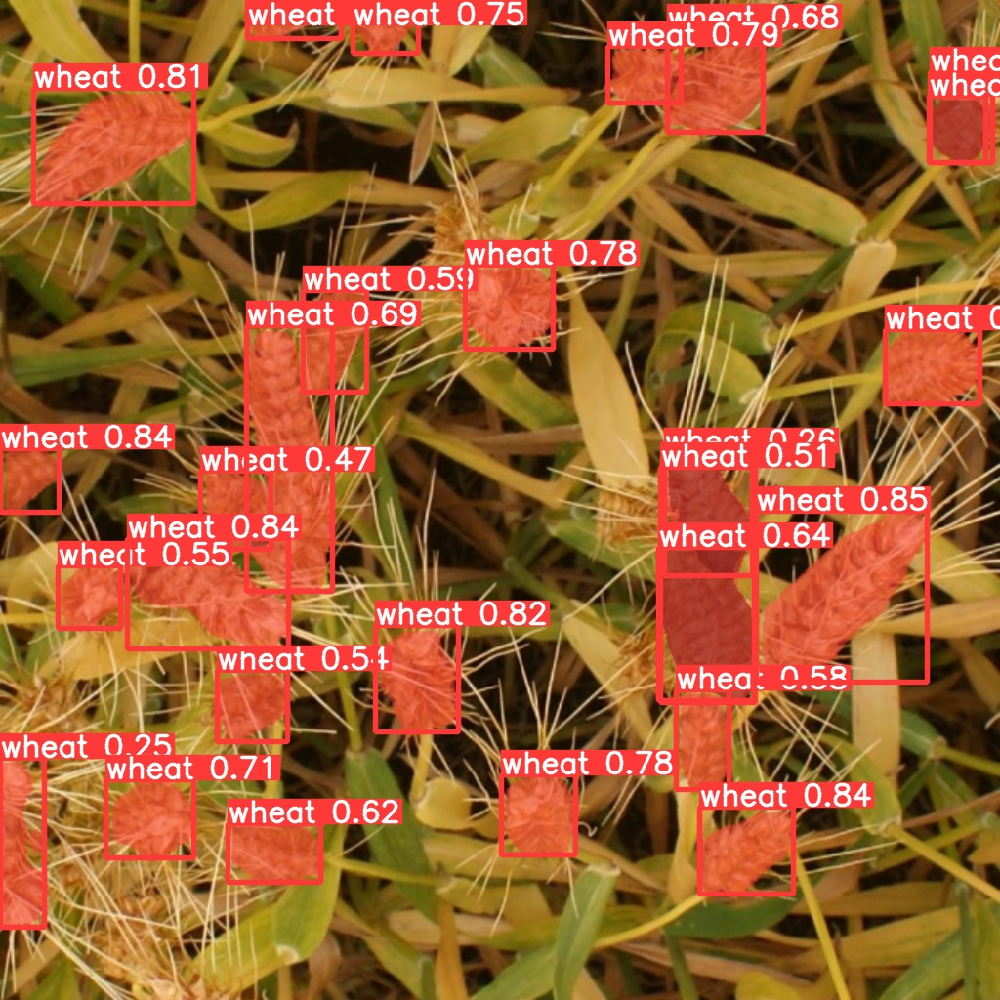

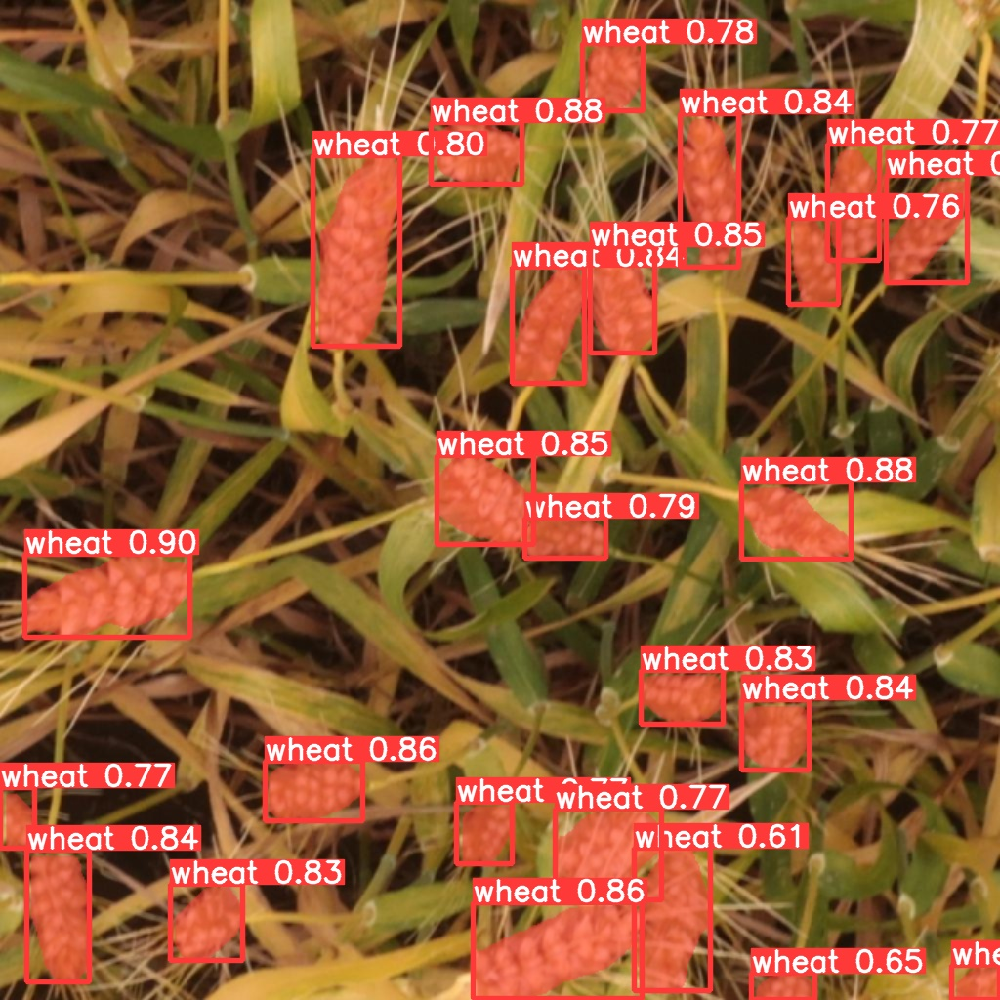

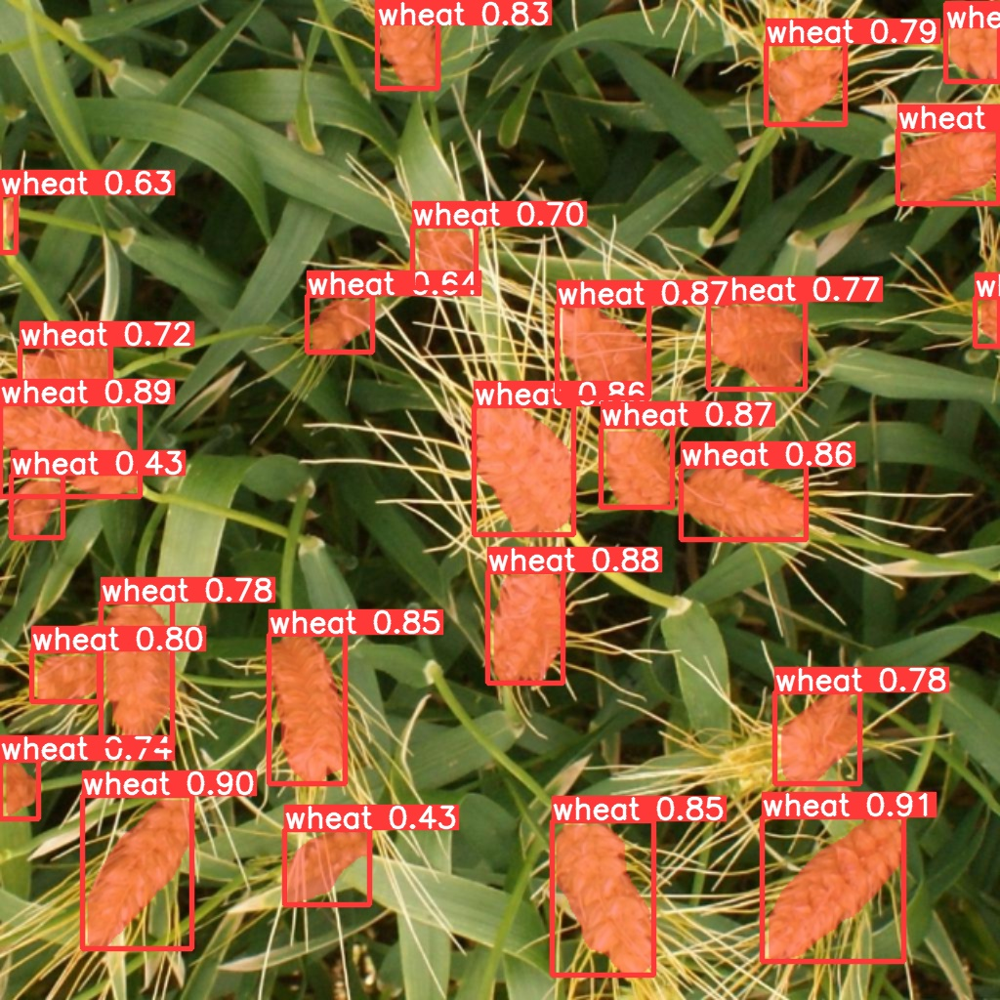

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict17/*.jpg')[:10]:
      display(Image(filename=image_path, height=600))
      print("\n")

In [ ]:
project.version(dataset.version).deploy(model_type="yolov8-seg", model_path=f"{HOME}/runs/segment/train/")

An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.


In [12]:
model = YOLO(f'{HOME}/yolov8s-seg.pt')
model.export(format='onnx')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.00GHz)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

PyTorch: starting from '/content/yolov8s-seg.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 116, 8400), (1, 32, 160, 160)) (22.8 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 81.2 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 7.7s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 9.6s, saved as '/content/yolov8s-seg.onnx' (45.3 MB)

Export complete (13.1s)
Results saved to /content
Predict:         yolo predict task=segment model=/content/yolov8s-seg.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/yolov8s-seg.onnx imgsz=

'/content/yolov8s-seg.onnx'

In [31]:
from ultralytics import YOLO

model_onnx = YOLO(f'{HOME}/yolov8s-seg.onnx')

In [34]:
import torch
torch.device('cpu')  # Set the device to CPU

# Run inference on CPU
results_list_cpu = model.predict('/content/27bf608b8.jpg', save=True, imgsz=640, conf=0.5)

# Access and print speeds
first_result_cpu = results_list_cpu[0]
speed_cpu = first_result_cpu.speed
print(f"CPU speed: {speed_cpu}")


first_result_cpu = model_onnx.predict('/content/27bf608b8.jpg', save=True, imgsz=640, conf=0.5)

# Access and print speeds
first_result_cpu = first_result_cpu[0]
speed_cpu = first_result_cpu.speed
print(f"CPU speed: {speed_cpu}")



image 1/1 /content/27bf608b8.jpg: 640x640 1 broccoli, 786.5ms
Speed: 4.6ms preprocess, 786.5ms inference, 6.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict15



CPU speed: {'preprocess': 4.604339599609375, 'inference': 786.4701747894287, 'postprocess': 6.6890716552734375}


image 1/1 /content/27bf608b8.jpg: 640x640 1 broccoli, 483.1ms
Speed: 4.3ms preprocess, 483.1ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict16


CPU speed: {'preprocess': 4.324436187744141, 'inference': 483.1221103668213, 'postprocess': 5.369663238525391}


In [35]:
torch.device('cuda')  # Set the device to GPU (if available)

# Run inference on GPU
results_list_gpu = model.predict('/content/27bf608b8.jpg', save=True, imgsz=640, conf=0.5)

# Access and print speeds
first_result_gpu = results_list_gpu[0]
speed_gpu = first_result_gpu.speed
print(f"GPU speed: {speed_gpu}")

# Run inference on GPU
results_list_gpu = model_onnx.predict('/content/27bf608b8.jpg', save=True, imgsz=640, conf=0.5)

# Access and print speeds
first_result_gpu = results_list_gpu[0]
speed_gpu = first_result_gpu.speed
print(f"GPU speed: {speed_gpu}")


image 1/1 /content/27bf608b8.jpg: 640x640 1 broccoli, 495.9ms
Speed: 5.1ms preprocess, 495.9ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict15



GPU speed: {'preprocess': 5.101919174194336, 'inference': 495.88704109191895, 'postprocess': 5.550861358642578}


image 1/1 /content/27bf608b8.jpg: 640x640 1 broccoli, 470.1ms
Speed: 3.5ms preprocess, 470.1ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict16


GPU speed: {'preprocess': 3.455638885498047, 'inference': 470.0655937194824, 'postprocess': 5.1631927490234375}
